# Problem Statement -

- The objective of this project is to develop a predictive maintenance model for CNC or lathe machines using machine learning techniques to reduce downtime and maintenance costs. 
- The CNC or lathe machine is a critical component of manufacturing and industrial operations and requires regular maintenance to ensure optimal performance. 
- The primary objective is to predict the maintenance schedule and detect potential failures before they occur using sensor data, maintenance logs, and other relevant information. 
- The project aims to develop a model that accurately predicts the maintenance schedule, reducing the unplanned downtime, optimizing maintenance scheduling, and extending the lifespan of the CNC or lathe machine. 
- The project will require developing, training, and testing the machine learning model using appropriate data sets, ensuring accuracy, and building a user-friendly interface for easy accessibility of the maintenance schedule. 
- The successful completion of this project will help manufacturing and industrial operations reduce their maintenance costs, improve their operational efficiency, and provide a better return on investment.

# 1) Import libraries/ Dipendancies -

In [1]:
# Importing libraries for Data Manipulation
import pandas as pd
import numpy as np

# Importing Libraries for file handling
import json
import pickle

# Libraries which are required for maodel training and Evaluation
from scipy.stats import zscore,mode
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier,plot_tree
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.metrics import precision_score,recall_score,confusion_matrix,accuracy_score,classification_report,f1_score
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.feature_selection import f_classif

# Library required for sampling of data
from imblearn.over_sampling import SMOTE

# Importing warnings to filter warnings and ignore them
import warnings
warnings.filterwarnings("ignore")

# Importing Visualization Libraries
import seaborn as sns
import matplotlib.pyplot as plt 

# Importing ipython for maximum display of columns and rows
from IPython.display import display
pd.set_option("display.max_columns",None)
pd.set_option("display.max_rows",None)
%matplotlib inline

# Importing Libraries to generate pandas Profilling Report
import pandas_profiling
from collections import Counter

# 2) Data Gathering and Data Validitation -¶

For the data we have suffered a lot and finally we have got best data for the mechanical machines like lathe and cnc etc. then by using excel we performed Data quality checks of tthe data and also tried to get basic information from the data.

In [2]:
# Reading CSV File -
i0_pm_df = pd.read_csv("predictive_maintenance.csv")
i0_pm_df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551.0,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408.0,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498.0,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,NaN,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,NaN,40.0,9,0,No Failure


# 3) EDA (Exploratory Data Analysis) -

In [ ]:
Steps Involved in EDA - 
    1) Information about Datset
    2) Describe Dataset
    3) Find Missing Values / Percentage of Missing Values
    4) Value Counts of Each Object Feature
    4) Desciding Encoding Types
    5) Outliers Detection
    6) Correlation with Target Feature
    7) VIF (Variance Inflation Factor)
    8) Status of Target Feature
    9) EDA report

## Information about Datset

In [ ]:
# Checking information of dataset
i0_pm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Type                     10000 non-null  object 
 3   Air temperature [K]      10000 non-null  float64
 4   Process temperature [K]  10000 non-null  float64
 5   Rotational speed [rpm]   9994 non-null   float64
 6   Torque [Nm]              10000 non-null  float64
 7   Tool wear [min]          10000 non-null  int64  
 8   Target                   10000 non-null  int64  
 9   Failure Type             10000 non-null  object 
dtypes: float64(4), int64(3), object(3)
memory usage: 781.4+ KB


 Here we have got basic information about data like non null count, memory usage and Data type of Features.Here in the dataset there are missing values in Rotational speed [rpm]. there are 3 object features which are Product ID, Type, Failure Type and other feature are numerical.

## Describe Dataset

In [ ]:
# Here we are printing Description of dataset and got all the stats of the numerical features.
i0_pm_df.describe().T

,count,mean,std,min,25%,50%,75%,max
UDI,10000.0,5000.500000,2886.895680,1.0,2500.75,5000.5,7500.25,10000.0
Air temperature [K],10000.0,300.004930,2.000259,295.3,298.30,300.1,301.50,304.5
Process temperature [K],10000.0,310.005560,1.483734,305.7,308.80,310.1,311.10,313.8
Rotational speed [rpm],9994.0,1538.797579,179.321675,1168.0,1423.00,1503.0,1612.00,2886.0
Torque [Nm],10000.0,39.986910,9.968934,3.8,33.20,40.1,46.80,76.6
Tool wear [min],10000.0,107.951000,63.654147,0.0,53.00,108.0,162.00,253.0
Target,10000.0,0.033900,0.180981,0.0,0.00,0.0,0.00,1.0


From above table we can clearly see that there are chances of outliers in Rotational speed [rpm],Torque [Nm] and in Tool wear [min]. these are  taken from the 75 percent polpulation value max vale 25 percent population value and minimum value. we can also figure ou there are continuous values in the UDI feature as there is data split in the each quantiles.

## Find Missing Values / Percentage of Missing Values

In [ ]:
# Count of Missing Values in Each Numerical Feature 
i0_pm_df.isna().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     6
Torque [Nm]                0
Tool wear [min]            0
Target                     0
Failure Type               0
dtype: int64

In [ ]:
# Percentage of Missing Values in Each Numerical Feature
i0_pm_df.isna().mean() * 100

UDI                        0.00
Product ID                 0.00
Type                       0.00
Air temperature [K]        0.00
Process temperature [K]    0.00
Rotational speed [rpm]     0.06
Torque [Nm]                0.00
Tool wear [min]            0.00
Target                     0.00
Failure Type               0.00
dtype: float64

As we See above There are Missing values in Rotational speed [rpm] feature. Missing data within Rotational speed [rpm] would not be much damaging, but would still cause training errors. So we have to replace those values or drop those entries as those entries are not much in percentage of data.

- Rotational speed [rpm] Feature -

  - Values = 6
  - Percentage = 0.06%

## Value Counts of Each Object Feature

In [ ]:
# Here we are checking separately for the Product ID feature as it contains all unique values.
i0_pm_df["Product ID"].nunique()

10000

In [ ]:
# Checking for the shape of the DataFrame
i0_pm_df.shape

(10000, 10)

So there are total 10000 datapoints in the table and unique values count of the Product ID feature is 10000. There are all unique values in the feature Product ID so we can drop it.

In [ ]:
# Here we are checking for the Value counts of each Object datatype features other than Product ID feature.
columns = i0_pm_df.select_dtypes(include="object").drop("Product ID",axis=1).columns.to_list()
for feature in columns:
    print("Column Name - ",feature)
    print(i0_pm_df[feature].value_counts().sort_values(ascending=False))
    print()

Column Name -  Type
L    6000
M    2997
H    1003
Name: Type, dtype: int64

Column Name -  Failure Type
No Failure                  9652
Heat Dissipation Failure     112
Power Failure                 95
Overstrain Failure            78
Tool Wear Failure             45
Random Failures               18
Name: Failure Type, dtype: int64



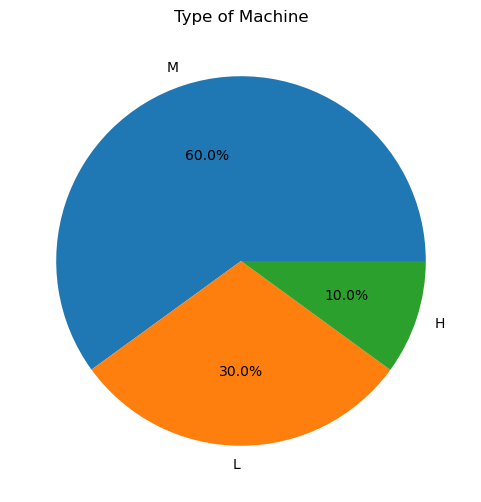

In [ ]:
# Pie plot of Value counts in the feature Type
fig = plt.figure(figsize=(6,6))
line1 = plt.pie(i0_pm_df["Type"].value_counts(),labels = i0_pm_df["Type"].unique(),autopct="%1.1f%%")
plt.title('Type of Machine')
plt.show()

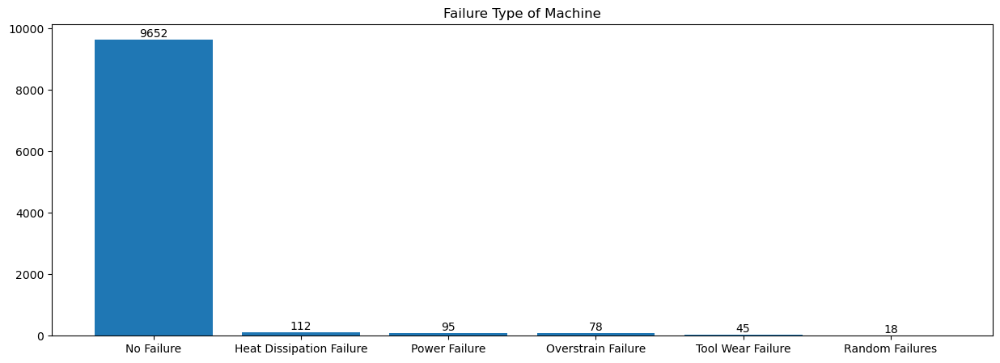

In [ ]:
# Bar graph of Value counts in the feature Failure Type
fig, ax = plt.subplots()
ax.figure.set_size_inches(15,5)
dict1 = i0_pm_df["Failure Type"].value_counts().to_dict()
x1 = list(dict1.keys())
y1 = list(dict1.values())
plt.bar(x1,y1)
for container in ax.containers:
    ax.bar_label(container)
plt.title('Failure Type of Machine')
plt.show()

Targetting 2 Object Datatype feature which are Type and Failure Type. We are checking for distribution of Data from Those Features.
- Column Name - Type
  - M = 6000 (60.00%)
  - L = 2997 (30.00%)
  - H = 1003 (10.00%)
- Column Name - Failure Type
  - No Failure = 9652
  - Heat Dissipation Failure = 112
  - Power Failure = 95
  - Overstrain Failure = 78
  - Tool Wear Failure = 45
  - Random Failures = 18

## Desciding Encoding Types

In [ ]:
# Checking for any sequence is the object columns so we can select encoding techniques.
cols = i0_pm_df.select_dtypes(include="object").columns.to_list()
for feature in cols:
    print("Column Name - ",feature)
    print(i0_pm_df[feature].unique())
    print()

Column Name -  Product ID
['M14860' 'L47181' 'L47182' ... 'M24857' 'H39412' 'M24859']

Column Name -  Type
['M' 'L' 'H']

Column Name -  Failure Type
['No Failure' 'Power Failure' 'Tool Wear Failure' 'Overstrain Failure'
 'Random Failures' 'Heat Dissipation Failure']



- Here we can clearely see there is no any precedence or sequence in the Product ID Feature and having all unique entities so we can drop it.

- Features for OneHotEncoding / Get Dummies - Type
  - Here we can clearely see there is no precedence or sequence in the Type Feature so we have to use either or OneHotEncoding / Get Dummies function.

- Features for Label Encoding - Failure Type
  - As there are numerical values in the Failure Type feature i.e Target Feature so we require need of Label Encoding Technique
  - As there are numerical values in the Target feature i.e Target Feature so we doesnt require need of Label Encoding Technique

## Outliers Detection

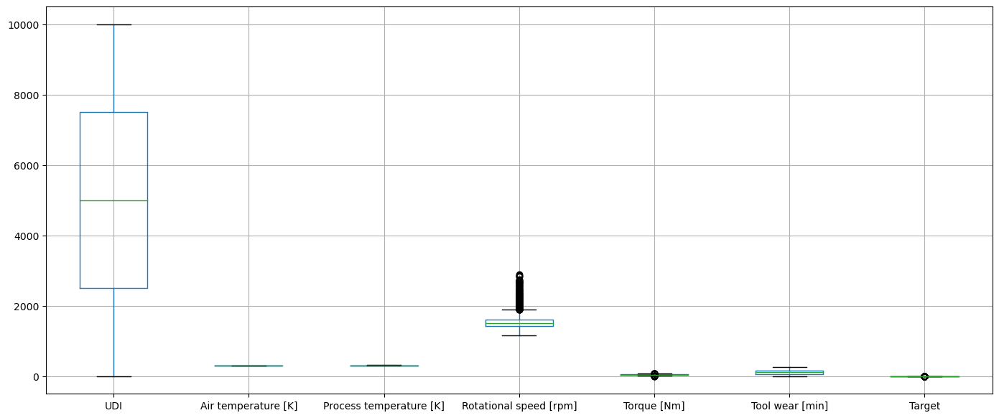

In [ ]:
# Here we can see there ae outliers in the every feature
plt.figure(figsize=(17,7))
i0_pm_df.boxplot()
plt.show()

Here we can clearly see the outliers in the Torque [Nm] and Rotational speed [rpm] features, so we have to check for those columns Separately. We have to check especially for Rotational speed [rpm] and Torque [Nm] features because there are outliers in that feature at a first glance.

### UDI Feature

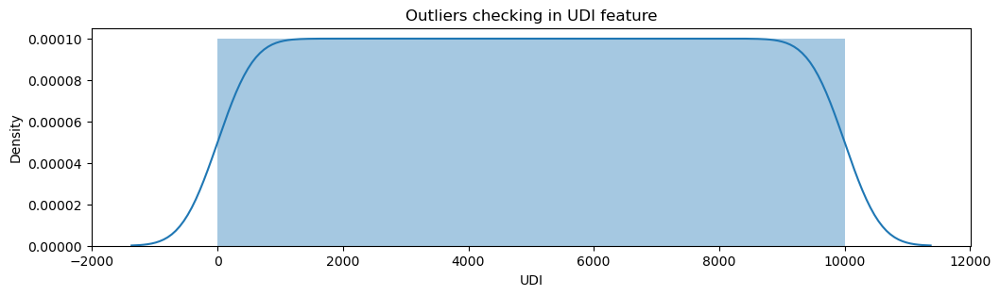

In [ ]:
# Checking of outliers in UDI Feature using distplot
plt.figure(figsize=(12,3))
sns.distplot(i0_pm_df["UDI"])
plt.title("Outliers checking in UDI feature")
plt.show()

We can clearly see the density distribution so curve is Normally distributed and there are no-outliers and due to all unique values we can drop it.

### Air temperature [K]

In [ ]:
# Count of outliers in Air temperature [K] by using Z-score method
z = zscore(i0_pm_df["Air temperature [K]"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in Air temperature [K] - {len(z1)}")

Count of Outliers in Air temperature [K] - 0


Here we can say practically there are no outliers present in Air temperature [K] feature.

### Process temperature [K]

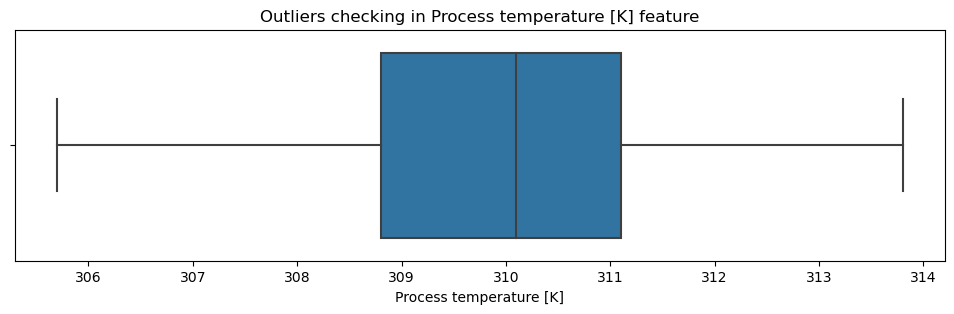

In [ ]:
# Checking of outliers in Process temperature [K] Feature
plt.figure(figsize=(12,3))
sns.boxplot(x=i0_pm_df["Process temperature [K]"])
plt.title("Outliers checking in Process temperature [K] feature")
plt.show()

we can see there are no outliers in the Process temperature [K] feature.

### Rotational speed [rpm]

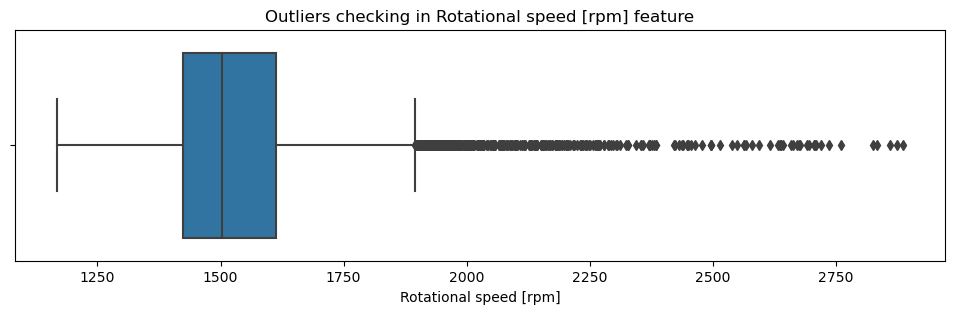

In [ ]:
# Count of outliers in Rotational speed [rpm] by using boxplot method
plt.figure(figsize=(12,3))
sns.boxplot(x=i0_pm_df["Rotational speed [rpm]"])
plt.title("Outliers checking in Rotational speed [rpm] feature")
plt.show()

In [ ]:
# Count of outliers in Rotational speed [rpm] by using Z-score method
z = zscore(i0_pm_df["Rotational speed [rpm]"]).to_list()
z1 = []
for i in z:
    if i > 3 or i <-3:
        z1.append(i)
print(f"Count of Outliers in Rotational speed [rpm] - {len(z1)}")

Count of Outliers in Rotational speed [rpm] - 0


In [ ]:
# Count of Outliers using iqr method to crosscheck the above result.
q1 = i0_pm_df["Rotational speed [rpm]"].quantile(0.25)
q3 = i0_pm_df["Rotational speed [rpm]"].quantile(0.75)
iqr = q3 - q1
upper_tail = q3 + 1.5 * iqr
lower_tail = q1 - 1.5 * iqr
print(f"Upper tail - {upper_tail}\nLower tail - {lower_tail}")
count = i0_pm_df.loc[(i0_pm_df["Rotational speed [rpm]"] > upper_tail) | (i0_pm_df["Rotational speed [rpm]"] < lower_tail)].shape[0]
print(f"Count of Outliers in Rotational speed [rpm] - {count}")

Upper tail - 1895.5
Lower tail - 1139.5
Count of Outliers in Rotational speed [rpm] - 418


Rotational speed [rpm] in this column there are 418 outliers by IQR method and using boxplot there are outliers in this Feature. We have to either replace those outlliers or reduce the impact of those.

### Torque [Nm]

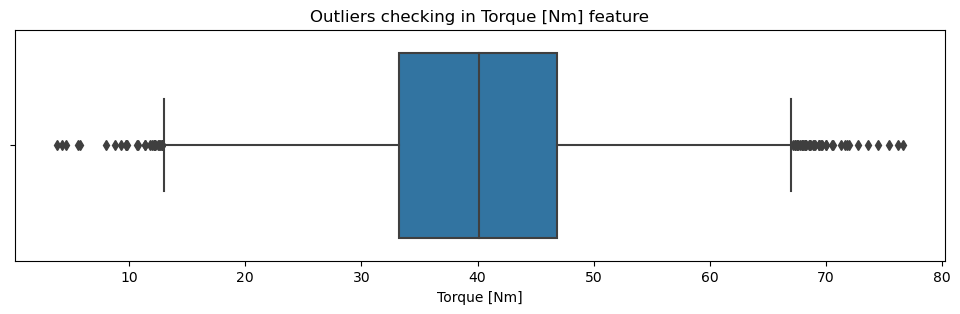

In [ ]:
# Checking of outliers in Torque [Nm] Feature
plt.figure(figsize=(12,3))
sns.boxplot(x = i0_pm_df["Torque [Nm]"])
plt.title("Outliers checking in Torque [Nm] feature")
plt.show()

In [ ]:
# Count of outliers in person_emp_length by using Z-score method, here z-score is showing
z = zscore(i0_pm_df["Torque [Nm]"]).to_list()
z1 = []
for i in z:
    if i > 3 or i < -3:
        z1.append(i)
print(f"Count of Outliers in Torque [Nm] - {len(z1)}")

Count of Outliers in person_emp_length - 0


In [ ]:
# Count of Outliers using iqr method to crosscheck the above result.
q1 = i0_pm_df["Torque [Nm]"].quantile(0.25)
q3 = i0_pm_df["Torque [Nm]"].quantile(0.75)
iqr = q3 - q1
upper_tail = q3 + 1.5 * iqr
lower_tail = q1 - 1.5 * iqr
print(f"Upper tail - {upper_tail}\nLower tail - {lower_tail}")
count = i0_pm_df.loc[(i0_pm_df["Torque [Nm]"] > upper_tail) | (i0_pm_df["Torque [Nm]"] < lower_tail)].shape[0]
print(f"Count of Outliers in Torque [Nm] - {count}")

Upper tail - 67.19999999999999
Lower tail - 12.800000000000011
Count of Outliers in Torque [Nm] - 69


Torque [Nm] in this column there are 69 outliers by IQR method and using boxplot there are outliers in this Feature. We have to either replace those outlliers or reduce the impact of those.

### Tool wear [min]

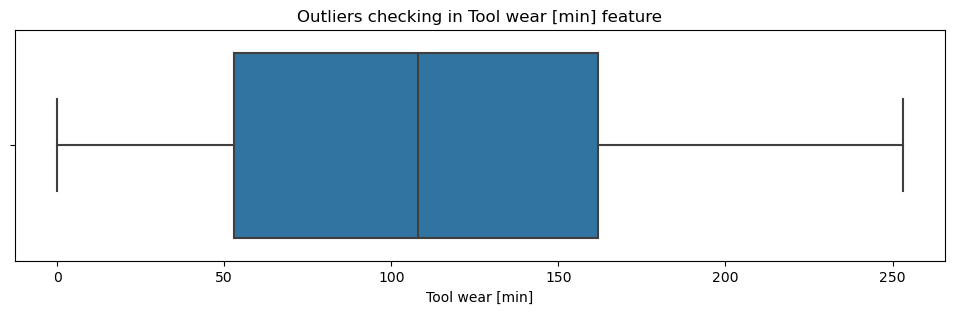

In [ ]:
# Checking of outliers in Tool wear [min] Feature
plt.figure(figsize=(12,3))
sns.boxplot(x = i0_pm_df["Tool wear [min]"])
plt.title("Outliers checking in Tool wear [min] feature")
plt.show()

we can see there are no outliers in the Tool wear [min] feature.

### Correlation with Target Feature

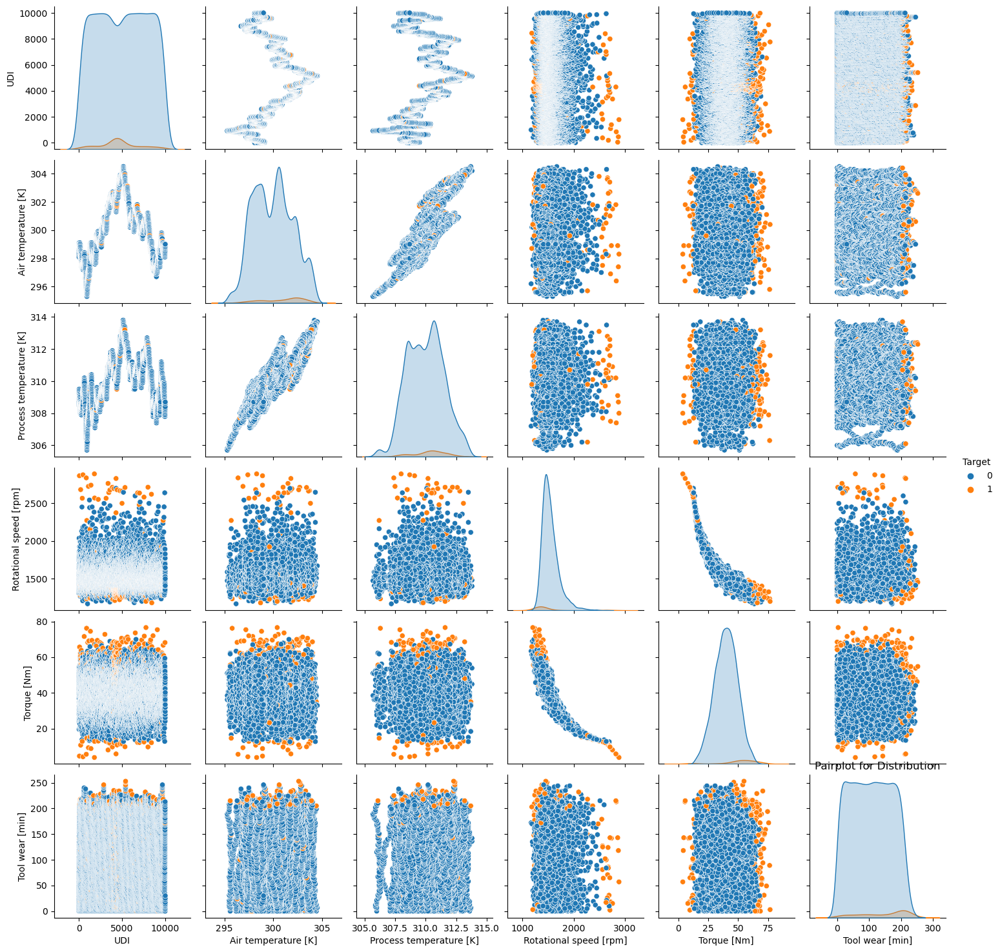

In [ ]:
# Pairplot for Distribution
sns.pairplot(i0_pm_df,hue="Target")
plt.title("Pairplot for Distribution")
plt.show()

In [ ]:
# Checking for correlation of independent feature with dependent features and and we are not getting good correlation.
i0_pm_df.corr()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
UDI,1.000000,0.117428,0.324428,-0.006829,0.003207,-0.010702,-0.022892
Air temperature [K],0.117428,1.000000,0.876107,0.022564,-0.013778,0.013853,0.082556
Process temperature [K],0.324428,0.876107,1.000000,0.019170,-0.014061,0.013488,0.035946
Rotational speed [rpm],-0.006829,0.022564,0.019170,1.000000,-0.875079,0.000027,-0.044214
Torque [Nm],0.003207,-0.013778,-0.014061,-0.875079,1.000000,-0.003093,0.191321
Tool wear [min],-0.010702,0.013853,0.013488,0.000027,-0.003093,1.000000,0.105448
Target,-0.022892,0.082556,0.035946,-0.044214,0.191321,0.105448,1.000000


In [ ]:
# Checking for correlation
df2 = i0_pm_df.corr().iloc[6,:].to_frame().T
df2

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
Target,-0.022892,0.082556,0.035946,-0.044214,0.191321,0.105448,1.0


<Figure size 800x700 with 0 Axes>

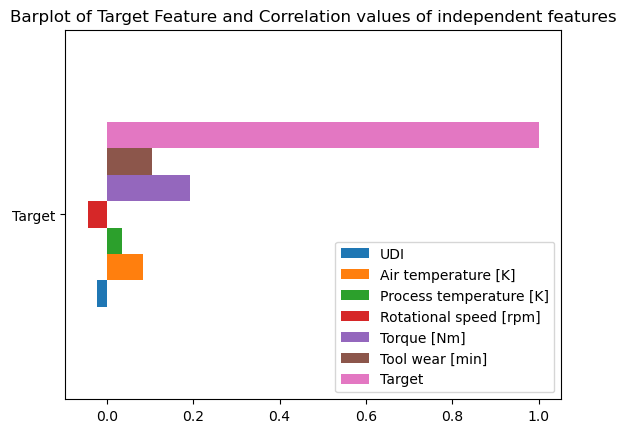

In [ ]:
# bar plot of correlation of Target feature with respect to all independent features. 
plt.figure(figsize=(8,7))
df2.plot(kind="barh")
plt.title("Barplot of Target Feature and Correlation values of independent features")
plt.show()

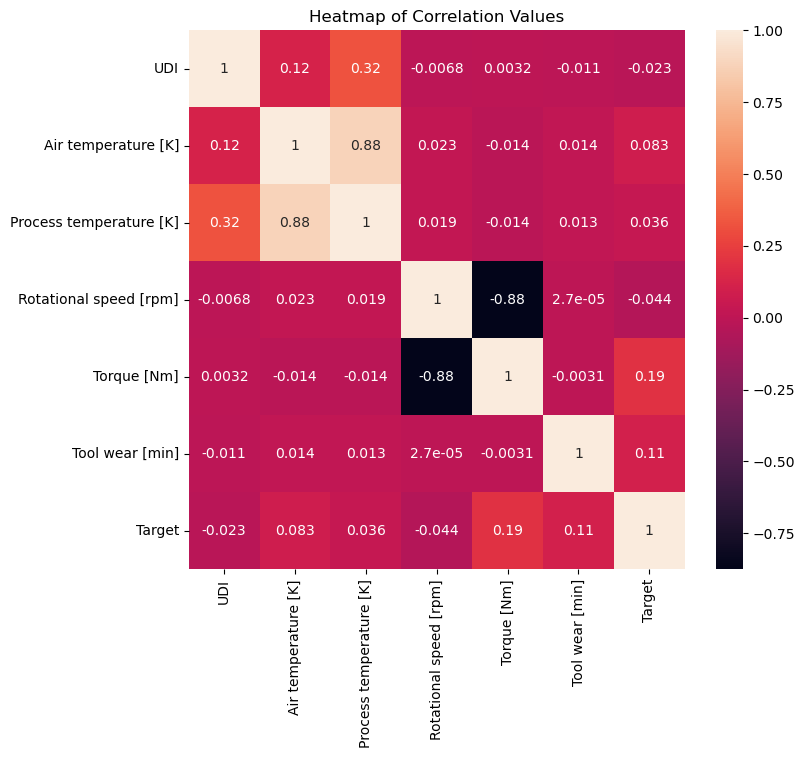

In [ ]:
# Heatmap for correlation Values
plt.figure(figsize=(8,7))
sns.heatmap(i0_pm_df.corr(),annot=True)
plt.title("Heatmap of Correlation Values")
plt.show()

Range of Good correlation/Predictors is -0.7 to -1 for negative correlation and 0.7 to 1 for positive correlation. from above table,heatmap and horrizontal Bar graph there is no one feature which is best Describing the target Feature and almost all features having Worst correlation. which is in between -0.3 to 0.3.

### VIF (Variance Inflation Factor)

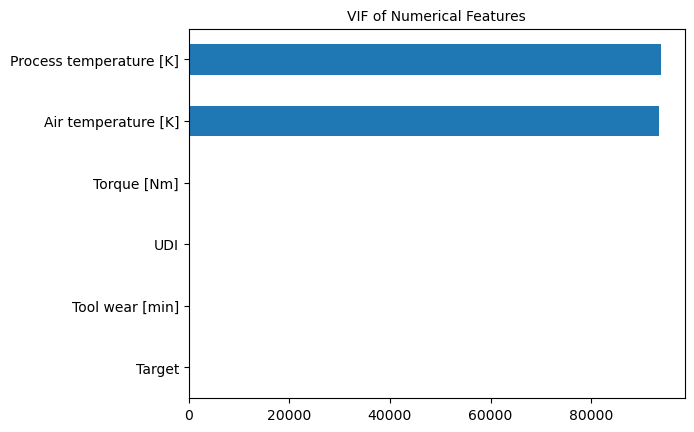

In [ ]:
# Checking for relation between independent features. Here im dropping Features having null values
x = i0_pm_df.select_dtypes(exclude="object").drop("Rotational speed [rpm]",axis = 1)
vif_list = []
for i in range(x.shape[1]):
    vif = variance_inflation_factor(x.to_numpy(),i)
    vif_list.append(vif)
x1 = pd.Series(vif_list,index=x.columns)
x1.sort_values().plot(kind="barh")
plt.title("VIF of Numerical Features",fontsize=10)
plt.show()

Variance inflation factors range is 0 to infinity. 0 to 5 vif score it suggests that there is no correlation between other independent features. If VIF sore is more than 5 then we cut off that feature but in this case most of the features are above vif range so we are not removing any feature. As there is highest VIF value of Process Temprature [K] and Air Temprature [K] also there is R value 0.88 for both the features those are highly correlated with each other. as per information of above we can drop this two features.

### Status of Target Feature

First of all We dont require label encoding beacuse Target column is actually in numerical datatype.In the case of Failure Type we require the label encoding. In this case 0 is No failure in the machine and 1 is Failure in machine.

In [ ]:
# Checking for Value counts of loan_status feature
i0_pm_df["Target"].value_counts()

0    9661
1     339
Name: Target, dtype: int64

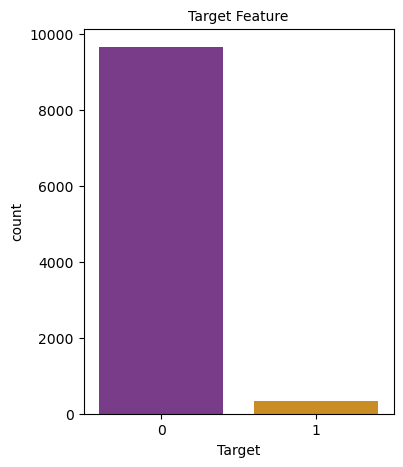

In [ ]:
# Countplot of loan Status Feature
plt.figure(figsize=(4,5))
sns.countplot(x = i0_pm_df["Target"], palette='CMRmap')
plt.title("Target Feature",fontsize=10)
plt.show()

So here we also got to know that there is bias in the categories so we have to perform sampling on it. Major category contains nearly 95 percent of data in the No failure category and minor category contains 5 percent data in failure of machine Category.

- Number of No Failure Machines: Equivalent to 5 % of the total Machines
- Number of Failure Machines: Equivalent to 95 % of the total Machines

There is colinearity between two target features so we are going to drop one target feature -
- Target is highly overall correlated with Failure Type
- Failure Type is highly overall correlated with Target

All Insights from EDA -
- `Product ID` has a high cardinality: 10000 distinct values
- `Air temperature [K]` is highly overall correlated with `Process temperature [K]`
- `Process temperature [K]` is highly overall correlated with `Air temperature [K]`
- `Rotational speed [rpm]` is highly overall correlated with `Torque [Nm]`
- `Torque [Nm]` is highly overall correlated with Rotational `speed [rpm]`
- `Target` is highly overall correlated with `Failure Type`
- `Failure Type` is highly overall correlated with `Target`
- `Target` is highly imbalanced (78.6%)
- `Failure Type` is highly imbalanced (88.7%)
- `UDI` is uniformly distributed
- `Product ID` is uniformly distributed
- `UDI` has unique values
- `Product ID` has unique values
- `Tool wear [min]` has 120 (1.2%) zeros

### EDA Report using Pandas Profilling

In [ ]:
# Creating pandas Profiling Report
pf = pandas_profiling.ProfileReport(i0_pm_df)
pf.to_widgets()

In [ ]:
# Saving Pandas Profilling Report in the html format.
pf.to_file("EDA Report.html")

### 4) Making Hypothesis for Testing

Defining Hypothesis features wise by taking consideration the insights of above EDA part - 
Here we are not taking UDI and Product ID Features in the consideration as they all contains Unique values.
- Type -
  - There are more cases of Failure for High Product Quality than Medium and Low Product Quality.
- Air temperature [K] -
  - More the Air temperature [K] Higher the failure cases.
- Process temperature [K] -
  - Higher the Process temperature [K] then higher the failure cases.
- Rotational speed [rpm] -
  - Lower the Rotational speed [rpm] then there are less chances of failure. 
- Torque [Nm] -
  - Lower the Torque [Nm] then there are less chances of failure.
- Tool wear [min] -
  - Higher the Tool wear time in minute there are more chances of failure.

# Hypothesis Testing

## Univariate Analysis -

### Numerical Variables -

In [ ]:
# creating a dataset for numerical attributes/features
num = i0_pm_df.select_dtypes(include=['int64', 'float64'])
num.head()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target
0,1,298.1,308.6,1551.0,42.8,0,0
1,2,298.2,308.7,1408.0,46.3,3,0
2,3,298.1,308.5,1498.0,49.4,5,0
3,4,298.2,308.6,NaN,39.5,7,0
4,5,298.2,308.7,NaN,40.0,9,0


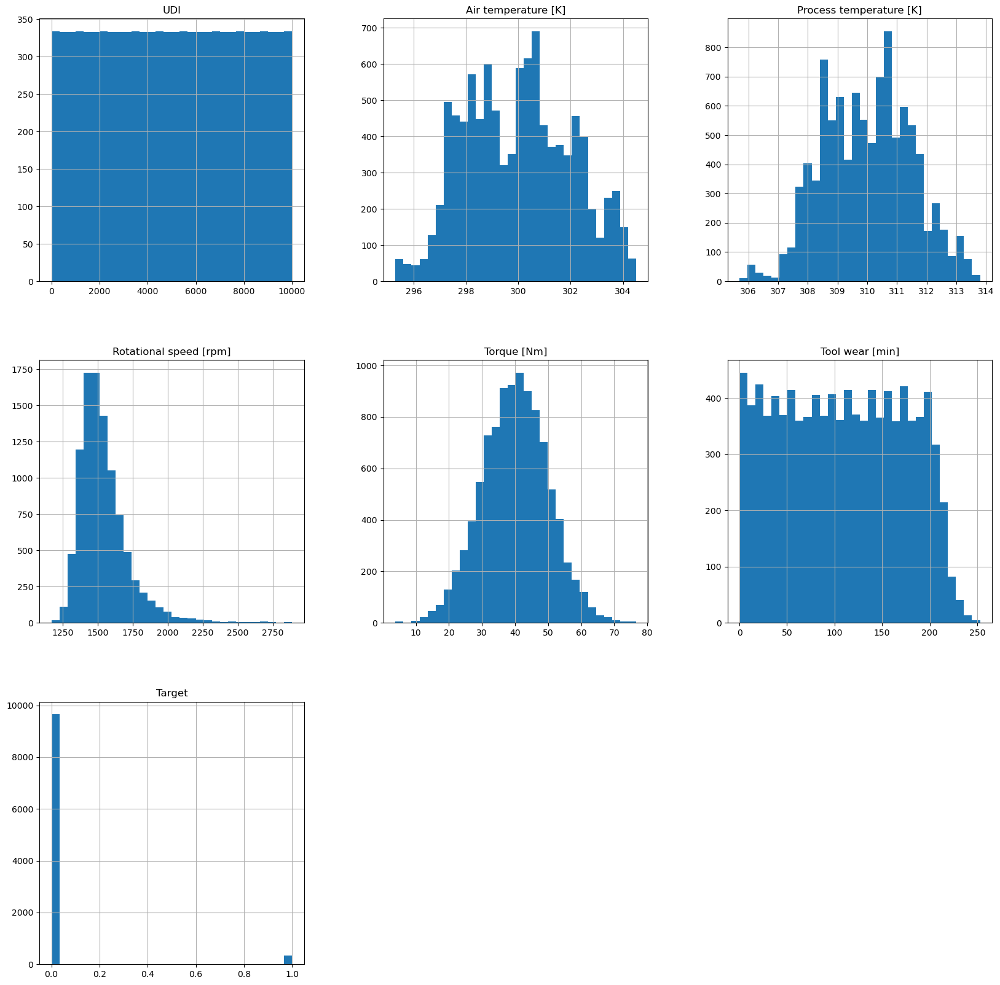

In [ ]:
# plots a histogram for all numerical attributes
_ = num.hist(bins=30,figsize=(20,20))

As we can observe, there is one variable that presents a normal distribution. There is normal distibution in Torque[NM] and udi feature having equal frequemcy distribution. Note that here, we're only exploring the data, not making any handling or transformation.

### Categorical Variables -

In [ ]:
# Creating a dataset for Categorical Features -
catego = i0_pm_df.select_dtypes(include="object")
catego.head()

,Product ID,Type,Failure Type
0,M14860,M,No Failure
1,L47181,L,No Failure
2,L47182,L,No Failure
3,L47183,L,No Failure
4,L47184,L,No Failure


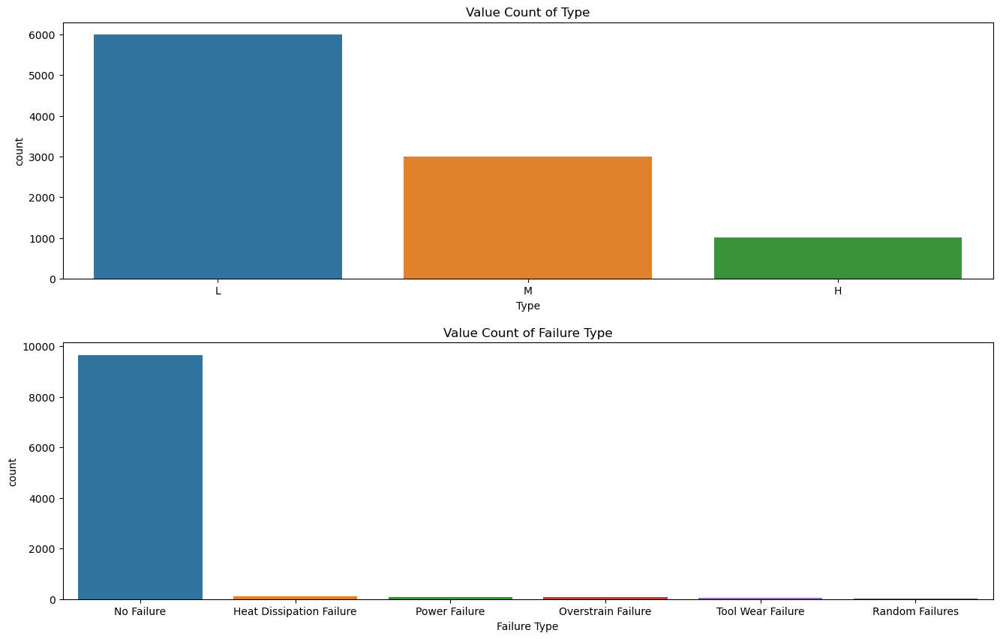

In [ ]:
# Charts to show Distribution or count of unique values in Categorical featues.
# We have not taken Product id because it contains all unique values.
fig, ax = plt.subplots()
ax.figure.set_size_inches(16,10)

plt.subplot(2,1,1)
sns.countplot(x=catego["Type"],order=catego["Type"].value_counts().index)
plt.title("Value Count of Type")

plt.subplot(2,1,2)
sns.countplot(x=catego["Failure Type"],order=catego["Failure Type"].value_counts().index)
plt.title("Value Count of Failure Type")

plt.subplots_adjust(hspace = 0.25)
plt.subplots_adjust(wspace = 0.25)
plt.show()

## Bivariate analysis - Hypothesis Validation¶

#### 1) There are more cases of Failure for High Product Quality than Medium and Low Product Quality -

In [ ]:
# Creating separate data frame for Failure cases -
i1_pm_df = i0_pm_df.groupby("Target").get_group(1)

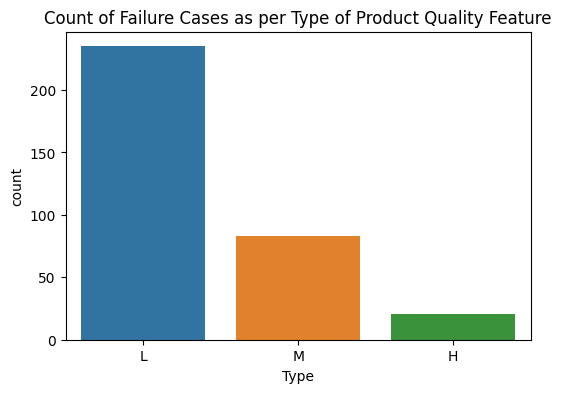

In [ ]:
# count plot of Value counts in the Type of Product Quality feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(6,4)

sns.countplot(x=i1_pm_df["Type"])
ax.set_title("Count of Failure Cases as per Type of Product Quality Feature", fontsize=12)
plt.show()

As we can see there are more cases of failure for the Low Product Quality and its followed bu Medium and High product Quality. 
- Thus Hypothesis is `False`

So, Here we are accepting Alternate Hypothesis. Thats why Failure cases are more for Low Product Quality and its followed bu Medium and High product Quality.

#### 2) More the Air temperature [K] Higher the failure cases - 

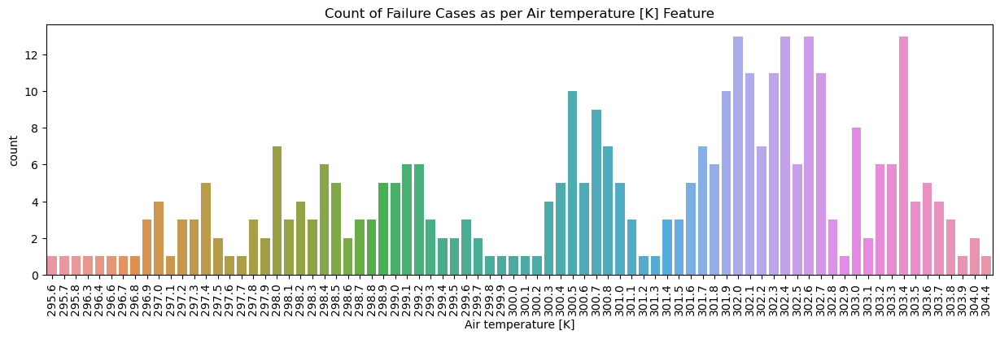

In [ ]:
# count plot of Value counts in the Air temperature [K] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(15,4)
plt.xticks(rotation=90)
sns.countplot(x=i1_pm_df["Air temperature [K]"])
ax.set_title("Count of Failure Cases as per Air temperature [K] Feature", fontsize=12)
plt.show()

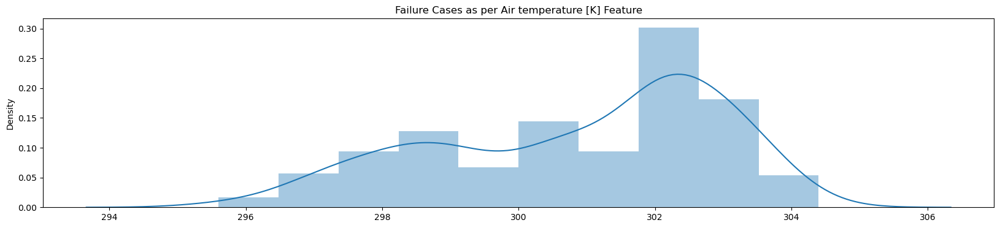

In [ ]:
# distplot of Value counts in the Air temperature [K] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
sns.distplot(x=i1_pm_df["Air temperature [K]"])
ax.set_title("Failure Cases as per Air temperature [K] Feature", fontsize=12)
plt.show()

As we can see frequency of failure cases is higher for higher Air temperature [K].

- Thus Hypothesis is `True`

#### 3) Higher the Process temperature [K] then higher the failure cases - 

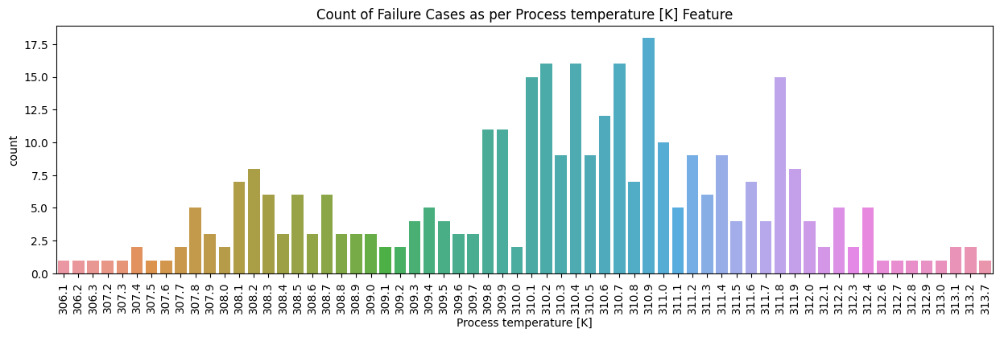

In [ ]:
# count plot of Value counts in the Air temperature [K] feature  
fig, ax = plt.subplots()
ax.figure.set_size_inches(15,4)
plt.xticks(rotation=90)
sns.countplot(x=i1_pm_df["Process temperature [K]"])
ax.set_title("Count of Failure Cases as per Process temperature [K] Feature", fontsize=12)
plt.show()

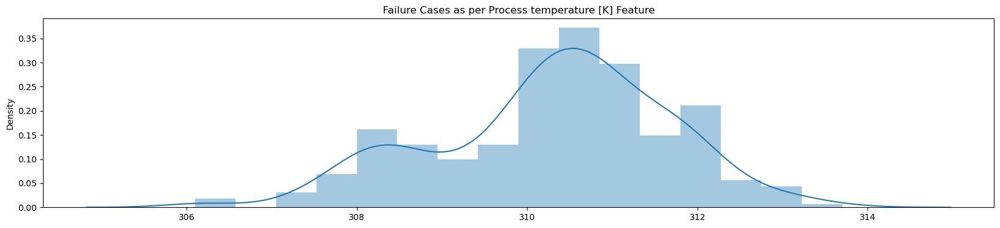

In [ ]:
# distplot of Value counts in the Process temperature [K] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
sns.distplot(x=i1_pm_df["Process temperature [K]"])
ax.set_title("Failure Cases as per Process temperature [K] Feature", fontsize=12)
plt.show()

As we can see There are more cases of Failure of machine for temperature in range 310.1 to 311.8 [k].

- Thus our Hypothesis is `False`

Here we are taking Alternate Hypothesis. There are more cases of failure for middle temperature range.

#### 4) Lower the Rotational speed [rpm] then there are less chances of failure -

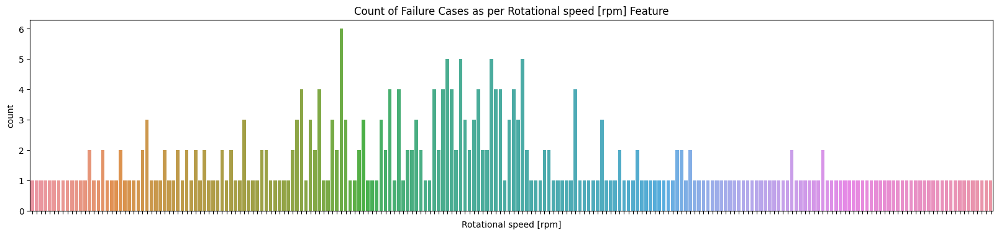

In [ ]:
# countplot of Value counts in the Rotational speed [rpm] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
plt.xticks(rotation=90)
sns.countplot(x=i1_pm_df["Rotational speed [rpm]"]).set(xticklabels=[])
ax.set_title("Count of Failure Cases as per Rotational speed [rpm] Feature", fontsize=12)
plt.show()

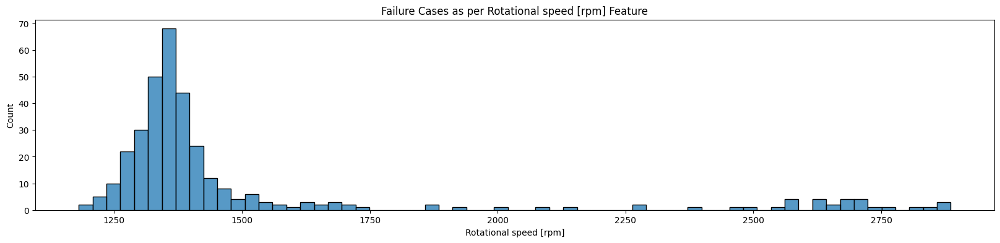

In [ ]:
# histplot of Value counts in the Rotational speed [rpm] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
sns.histplot(x=i1_pm_df["Rotational speed [rpm]"])
ax.set_title("Failure Cases as per Rotational speed [rpm] Feature", fontsize=12)
plt.show()

we can see from the chart there are maximum cases of failure with lower Rotational speed [rpm]. 

- Thus our Hypothesis is `False`.

#### 5) Lower the Torque [Nm] then there are less chances of failure -

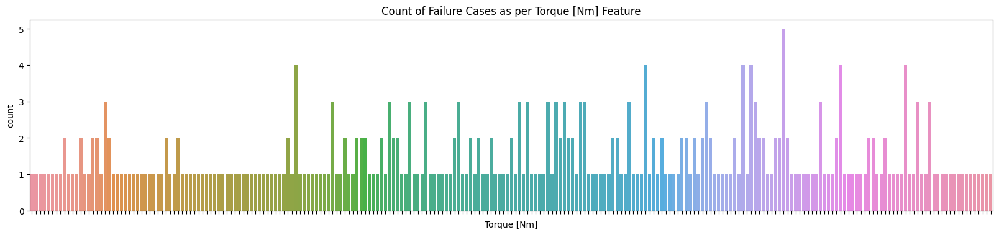

In [ ]:
# countplot of Value counts in the Torque [Nm] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
plt.xticks(rotation=90)
sns.countplot(x=i1_pm_df["Torque [Nm]"]).set(xticklabels=[])
ax.set_title("Count of Failure Cases as per Torque [Nm] Feature", fontsize=12)
plt.show()

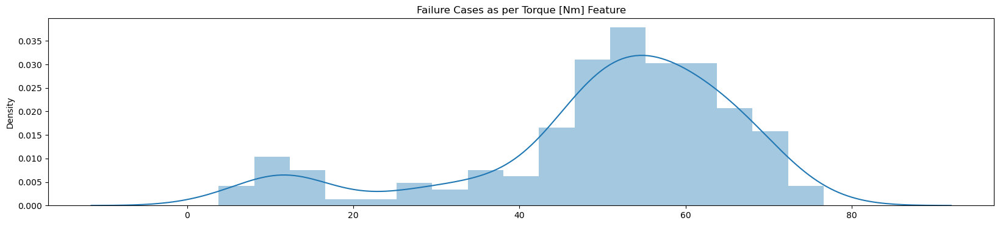

In [ ]:
# distplot of Value counts in the Torque [Nm] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
sns.distplot(x=i1_pm_df["Torque [Nm]"])
ax.set_title("Failure Cases as per Torque [Nm] Feature", fontsize=12)
plt.show()

From above Graph There are comparatively less cases of Failure of machine for Less Torque [Nm]. 
- Thus Hypothesis is `True`.

#### 6) Higher the tool wear time in minute there are more chances of failure -

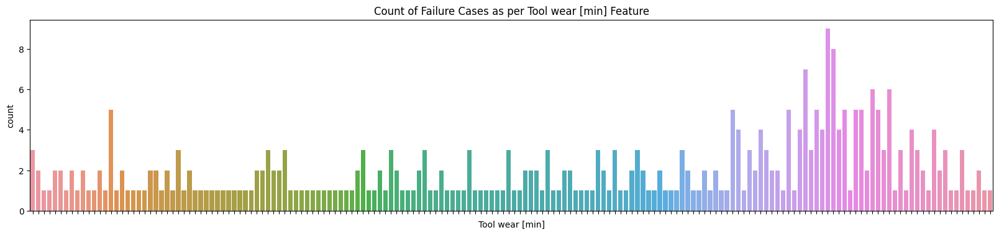

In [ ]:
# countplot of Value counts in the Tool wear [min] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
plt.xticks(rotation=90)
sns.countplot(x=i1_pm_df["Tool wear [min]"]).set(xticklabels=[])
ax.set_title("Count of Failure Cases as per Tool wear [min] Feature", fontsize=12)
plt.show()

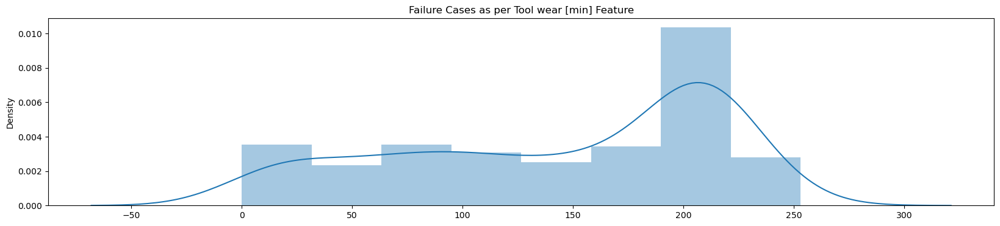

In [ ]:
# distplot of Value counts in the Tool wear [min] feature
fig, ax = plt.subplots()
ax.figure.set_size_inches(20,4)
sns.distplot(x=i1_pm_df["Tool wear [min]"])
ax.set_title("Failure Cases as per Tool wear [min] Feature", fontsize=12)
plt.show()

From above graph we see that there is higher Tool wear [min] then higher the failure cases.
- Thus our Hypothesis is `True`

In [ ]:
pd.options.display.max_colwidth = 130
result = pd.DataFrame({"ID":np.arange(1,7),
                    "Hypothesis":["There are more cases of Failure for High Product Quality than Medium and Low Product Quality.",
                                  "More the Air temperature [K] Higher the failure cases.",
                                  "Higher the Process temperature [K] then higher the failure cases.",
                                  "Lower the Rotational speed [rpm] then there are less chances of failure.",
                                  "Lower the Torque [Nm] then there are less chances of failure.",
                                  "Higher the Tool wear time in minute there are more chances of failure."],
                   "Conclusion":["False","True","False","False","True","True"]})
result.set_index("ID",inplace=True)
result

,Hypothesis,Conclusion
ID,,
1,There are more cases of Failure for High Product Quality than Medium and Low Product Quality.,False
2,More the Air temperature [K] Higher the failure cases.,True
3,Higher the Process temperature [K] then higher the failure cases.,False
4,Lower the Rotational speed [rpm] then there are less chances of failure.,False
5,Lower the Torque [Nm] then there are less chances of failure.,True
6,Higher the Tool wear time in minute there are more chances of failure.,True


In [ ]:
# Saving Data After EDA and Hypothesis testing in one File -
i0_pm_df.to_csv("Pred_Main.csv",index=False)

# 4) Feature Engineering - 

In [ ]:
1) Handling of Missing Values
2) Encoding - Ordinal,replace,OneHot,get_dummies()

### Handling of Missing Values

In [32]:
# Reading the CSV file dataset
i2_pm_df = pd.read_csv("Pred_Main.csv")
i2_pm_df.head()

,UDI,Product ID,Type,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type
0,1,M14860,M,298.1,308.6,1551.0,42.8,0,0,No Failure
1,2,L47181,L,298.2,308.7,1408.0,46.3,3,0,No Failure
2,3,L47182,L,298.1,308.5,1498.0,49.4,5,0,No Failure
3,4,L47183,L,298.2,308.6,NaN,39.5,7,0,No Failure
4,5,L47184,L,298.2,308.7,NaN,40.0,9,0,No Failure


We can use several different functions like `mean()` and `mode()` to replace missing data. The goal here is to keep as much of our data as we can! It's also important to check the distribution of that feature to see if it changed.

In [ ]:
# Checking again for missing data
i2_pm_df.isna().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     6
Torque [Nm]                0
Tool wear [min]            0
Target                     0
Failure Type               0
dtype: int64

In [ ]:
# Checking median,mode and mean values of Rotational speed [rpm] feature
(i2_pm_df["Rotational speed [rpm]"].median(),i2_pm_df["Rotational speed [rpm]"].mean(),
 mode(i2_pm_df["Rotational speed [rpm]"])[0][0])

(1503.0, 1538.7975785471283, 1452.0)

Here I am replacing the data from Rotational speed [rpm] by using Mode values

In [ ]:
# Handling Missing Values in Feature Rotational speed [rpm] by using Mode after discussion with buisness experties.
i2_pm_df["Rotational speed [rpm]"] = i2_pm_df["Rotational speed [rpm]"].replace(np.nan,i2_pm_df["Rotational speed [rpm]"].mode()[0])

In [ ]:
# Checking again for whether missing values are replaced or not
i2_pm_df.isna().sum()

UDI                        0
Product ID                 0
Type                       0
Air temperature [K]        0
Process temperature [K]    0
Rotational speed [rpm]     0
Torque [Nm]                0
Tool wear [min]            0
Target                     0
Failure Type               0
dtype: int64

### Encoding 

In [ ]:
# Features for OneHotEncoding / Get Dummies - Type
# Applying One-Hot-Encoding on Type feature.
oe = OneHotEncoder()
arr = oe.fit_transform(i2_pm_df[["Type"]]).toarray()
i3_pm_df = pd.DataFrame(arr,columns=i2_pm_df["Type"].unique())
i3_pm_df.head()

,M,L,H
0,0.0,0.0,1.0
1,0.0,1.0,0.0
2,0.0,1.0,0.0
3,0.0,1.0,0.0
4,0.0,1.0,0.0


Once the new columns have been created using one-hot encoding, we can concatenate them with the numeric columns to create a new data frame which will be used throughout the rest of the course for predicting probability of default.

In [ ]:
# Creating new df after one hot encoding
i4_pm_df = pd.concat([i2_pm_df,i3_pm_df],axis = 1)
i4_pm_df.drop("Type",axis=1,inplace=True)
i4_pm_df.head()

,UDI,Product ID,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,Failure Type,M,L,H
0,1,M14860,298.1,308.6,1551.0,42.8,0,0,No Failure,0.0,0.0,1.0
1,2,L47181,298.2,308.7,1408.0,46.3,3,0,No Failure,0.0,1.0,0.0
2,3,L47182,298.1,308.5,1498.0,49.4,5,0,No Failure,0.0,1.0,0.0
3,4,L47183,298.2,308.6,1452.0,39.5,7,0,No Failure,0.0,1.0,0.0
4,5,L47184,298.2,308.7,1452.0,40.0,9,0,No Failure,0.0,1.0,0.0


In [ ]:
# Checking for correct Encoding Happened or Not.
i4_pm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 12 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   UDI                      10000 non-null  int64  
 1   Product ID               10000 non-null  object 
 2   Air temperature [K]      10000 non-null  float64
 3   Process temperature [K]  10000 non-null  float64
 4   Rotational speed [rpm]   10000 non-null  float64
 5   Torque [Nm]              10000 non-null  float64
 6   Tool wear [min]          10000 non-null  int64  
 7   Target                   10000 non-null  int64  
 8   Failure Type             10000 non-null  object 
 9   M                        10000 non-null  float64
 10  L                        10000 non-null  float64
 11  H                        10000 non-null  float64
dtypes: float64(7), int64(3), object(2)
memory usage: 937.6+ KB


In [ ]:
# Checking for Statistics of dataset after Encoding.
i4_pm_df.describe()

,UDI,Air temperature [K],Process temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,M,L,H
count,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,5000.50000,300.004930,310.005560,1538.745500,39.986910,107.951000,0.033900,0.100300,0.600000,0.299700
std,2886.89568,2.000259,1.483734,179.280466,9.968934,63.654147,0.180981,0.300415,0.489922,0.458149
min,1.00000,295.300000,305.700000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,2500.75000,298.300000,308.800000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000
50%,5000.50000,300.100000,310.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,1.000000,0.000000
75%,7500.25000,301.500000,311.100000,1612.000000,46.800000,162.000000,0.000000,0.000000,1.000000,1.000000
max,10000.00000,304.500000,313.800000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000


# 5) Feature Selection 

From EDA and Feature engineering i have observed All datatypes are numerical except `Product ID` and `Failure Type`. Product ID feature contains all unique values and Failure type is a target feature. as there are two target features so i am not using Failure type. `UDI` is a feature and it contains 100% unique values so i am droping this feature.

In [ ]:
# Dropping Features containing unique values and target feature
i4_pm_df.drop(["UDI","Product ID","Failure Type"],axis=1,inplace=True)

### Anova Test

In [ ]:
# Checking for the p_value so i can cross check feature selection
x1 = i4_pm_df.drop("Target",axis=1)
y1 = i4_pm_df["Target"]
_ ,p_val = f_classif(x1,y1) 
df = pd.DataFrame({"P_val":np.around(p_val,4)},index=x1.columns)
df.head()

,P_val
Air temperature [K],0.0000
Process temperature [K],0.0003
Rotational speed [rpm],0.0000
Torque [Nm],0.0000
Tool wear [min],0.0000


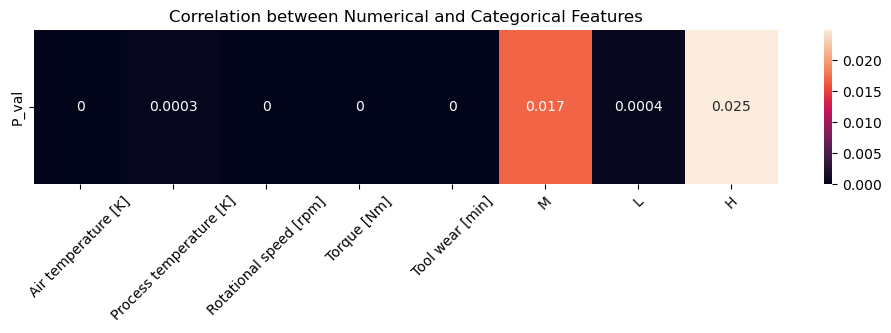

In [ ]:
# Ploting heatmap of P_values from anova test
fig, ax = plt.subplots()
ax.figure.set_size_inches(12,2)
sns.heatmap(df.T,annot=True,)
plt.title("Correlation between Numerical and Categorical Features")
plt.xticks(rotation=45)
plt.show()

There are two features having higher VIF and higher correlation with each other. from those Air temperature [K] and Process temperature [K] in which i am dropping `Process temperature [K]`. but anova test is showing that this feature is contributing in target prediction most. So after discussin with buisness expertise i am dropping `Process temperature [K]` feature.

In [ ]:
# Dropping Features Process temperature [K]
i4_pm_df.drop("Process temperature [K]",axis=1,inplace=True)

In [ ]:
# Checking for Correlation of Each independent feature with target feature.
i4_pm_df.corr()

,Air temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,M,L,H
Air temperature [K],1.000000,0.022823,-0.013778,0.013853,0.082556,-0.023025,0.006676,0.007958
Rotational speed [rpm],0.022823,1.000000,-0.874921,0.000462,-0.044156,-0.001114,0.004810,-0.004413
Torque [Nm],-0.013778,-0.874921,1.000000,-0.003093,0.191321,-0.004978,0.001191,0.001991
Tool wear [min],0.013853,0.000462,-0.003093,1.000000,0.105448,-0.002787,0.008232,-0.006976
Target,0.082556,-0.044156,0.191321,0.105448,1.000000,-0.023916,0.035643,-0.022432
M,-0.023025,-0.001114,-0.004978,-0.002787,-0.023916,1.000000,-0.408928,-0.218425
L,0.006676,0.004810,0.001191,0.008232,0.035643,-0.408928,1.000000,-0.801211
H,0.007958,-0.004413,0.001991,-0.006976,-0.022432,-0.218425,-0.801211,1.000000


In [ ]:
# Making Dataframe of correlation between independent and dependent values
df1 = pd.DataFrame(i4_pm_df.corr().iloc[:,4]).T
df1

,Air temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,M,L,H
Target,0.082556,-0.044156,0.191321,0.105448,1.0,-0.023916,0.035643,-0.022432


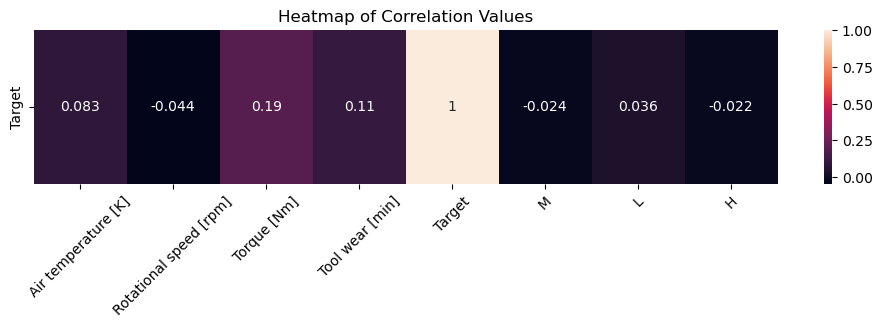

In [ ]:
# Heatmap of correlation Values
plt.figure(figsize=(12,2))
sns.heatmap(df1,annot=True)
plt.xticks(rotation = 45)
plt.title("Heatmap of Correlation Values")
plt.show()

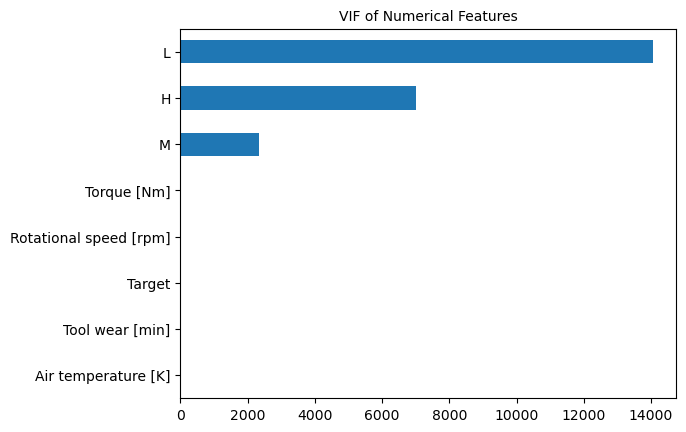

In [ ]:
# Checking for relation between independent features.
x = i4_pm_df
vif_list = []
for i in range(x.shape[1]):
    vif = variance_inflation_factor(x.to_numpy(),i)
    vif_list.append(vif)
x1 = pd.Series(vif_list,index=x.columns)
x1.sort_values().plot(kind="barh")
plt.title("VIF of Numerical Features",fontsize=10)
plt.show()

In [ ]:
# Checking Final df information and descriprion
i4_pm_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 8 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Air temperature [K]     10000 non-null  float64
 1   Rotational speed [rpm]  10000 non-null  float64
 2   Torque [Nm]             10000 non-null  float64
 3   Tool wear [min]         10000 non-null  int64  
 4   Target                  10000 non-null  int64  
 5   M                       10000 non-null  float64
 6   L                       10000 non-null  float64
 7   H                       10000 non-null  float64
dtypes: float64(6), int64(2)
memory usage: 625.1 KB


In [ ]:
i4_pm_df.describe()

,Air temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,M,L,H
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,300.004930,1538.745500,39.986910,107.951000,0.033900,0.100300,0.600000,0.299700
std,2.000259,179.280466,9.968934,63.654147,0.180981,0.300415,0.489922,0.458149
min,295.300000,1168.000000,3.800000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,298.300000,1423.000000,33.200000,53.000000,0.000000,0.000000,0.000000,0.000000
50%,300.100000,1503.000000,40.100000,108.000000,0.000000,0.000000,1.000000,0.000000
75%,301.500000,1612.000000,46.800000,162.000000,0.000000,0.000000,1.000000,1.000000
max,304.500000,2886.000000,76.600000,253.000000,1.000000,1.000000,1.000000,1.000000


In [ ]:
# Saving Data Feature Engineering and Selection in one File -
i4_pm_df.to_csv("Pred_Main_final.csv",index=False)

# 6) Model Selection 

In [3]:
# Reading the CSV file dataset
i5_pm_df = pd.read_csv("Pred_Main_final.csv")
i5_pm_df.head()

,Air temperature [K],Rotational speed [rpm],Torque [Nm],Tool wear [min],Target,M,L,H
0,298.1,1551.0,42.8,0,0,0.0,0.0,1.0
1,298.2,1408.0,46.3,3,0,0.0,1.0,0.0
2,298.1,1498.0,49.4,5,0,0.0,1.0,0.0
3,298.2,1452.0,39.5,7,0,0.0,1.0,0.0
4,298.2,1452.0,40.0,9,0,0.0,1.0,0.0


### 6.1) Splitting of dataset 

In [4]:
# Splitting of dataset for the training and testing
x = i5_pm_df.drop("Target",axis=1)
y = i5_pm_df["Target"]
x_train,x_test,y_train,y_test = train_test_split(x,y,train_size=0.8,random_state=42,stratify=y)

In [5]:
# Checking for the proper splitting happened or not.
print(f"X Train Shape - {x_train.shape}")
print(f"X Test Shape - {x_test.shape}")
print(f"Y Train Shape - {y_train.shape}")
print(f"Y Test Shape - {y_test.shape}")

X Train Shape - (8000, 7)
X Test Shape - (2000, 7)
Y Train Shape - (8000,)
Y Test Shape - (2000,)


We need to scale the data because the range of variables vary a lot within them, so we can treat each feature equally when the model ingests them. To reduce the impact of outliers it will help.

In [6]:
# Standardizing the data to resuce effect of outliers, Here we are using Standard scalar
ss = StandardScaler()
x_train = ss.fit_transform(x_train)
x_test = ss.transform(x_test)

### 6.2) Model fitting

In [7]:
# Model Training for logistic regression -
lr_model = LogisticRegression()
lr_model.fit(x_train,y_train)

LogisticRegression()

In [8]:
# Model Training for Descision Tree Classifier -
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

# 7) Model Evaluation

In [9]:
# Evaluation of logistic regression model on Training Data after sampling -
y_pred = lr_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_train,y_pred)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_train,y_pred)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_train,y_pred)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_train,y_pred)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_train,y_pred)
print(f"Classification report - \n{clf_rep}\n")

Confusion Matrix - 
[[7715   14]
 [ 213   58]]

Precision Score - 0.8055555555555556

Recall Score - 0.2140221402214022

f1 Score - 0.33819241982507287

Accuracy Score - 0.971625

Classification report - 
              precision    recall  f1-score   support

           0       0.97      1.00      0.99      7729
           1       0.81      0.21      0.34       271

    accuracy                           0.97      8000
   macro avg       0.89      0.61      0.66      8000
weighted avg       0.97      0.97      0.96      8000




In [10]:
# Evaluation of logistic regression model on Testing Data after sampling -
y_pred = lr_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_test,y_pred)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_test,y_pred)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_test,y_pred)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_test,y_pred)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_test,y_pred)
print(f"Classification report - \n{clf_rep}\n")

res = pd.DataFrame([["Logistic Regression",prec,rec,f1,acc]],
                   columns=["Model","Precision","Recall","f1 Score","Accuracy"])

Confusion Matrix - 
[[1928    4]
 [  59    9]]

Precision Score - 0.6923076923076923

Recall Score - 0.1323529411764706

f1 Score - 0.2222222222222222

Accuracy Score - 0.9685

Classification report - 
              precision    recall  f1-score   support

           0       0.97      1.00      0.98      1932
           1       0.69      0.13      0.22        68

    accuracy                           0.97      2000
   macro avg       0.83      0.57      0.60      2000
weighted avg       0.96      0.97      0.96      2000




In [11]:
# Evaluation of Descision Tree model on Training Data after sampling -
y_pred = dt_model.predict(x_train)

cnf_matrix = confusion_matrix(y_train,y_pred)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_train,y_pred)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_train,y_pred)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_train,y_pred)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_train,y_pred)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_train,y_pred)
print(f"Classification report - \n{clf_rep}\n")

Confusion Matrix - 
[[7729    0]
 [   0  271]]

Precision Score - 1.0

Recall Score - 1.0

f1 Score - 1.0

Accuracy Score - 1.0

Classification report - 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7729
           1       1.00      1.00      1.00       271

    accuracy                           1.00      8000
   macro avg       1.00      1.00      1.00      8000
weighted avg       1.00      1.00      1.00      8000




In [12]:
# Evaluation of Descision Tree model on Testing Data after sampling -
y_pred = dt_model.predict(x_test)

cnf_matrix = confusion_matrix(y_test,y_pred)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_test,y_pred)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_test,y_pred)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_test,y_pred)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_test,y_pred)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_test,y_pred)
print(f"Classification report - \n{clf_rep}\n")

res1 = pd.DataFrame([["Descision Tree",prec,rec,f1,acc]],
                   columns=["Model","Precision","Recall","f1 Score","Accuracy"])

Confusion Matrix - 
[[1898   34]
 [  34   34]]

Precision Score - 0.5

Recall Score - 0.5

f1 Score - 0.5

Accuracy Score - 0.966

Classification report - 
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      1932
           1       0.50      0.50      0.50        68

    accuracy                           0.97      2000
   macro avg       0.74      0.74      0.74      2000
weighted avg       0.97      0.97      0.97      2000




As per the Buisness Scenario we have to deal with the precision because i model classified failed machin as not fail then it will going to hamper the profit of buisness. if not failure machine classified as failure then its not that dangerous. so here i am considering the Logistic regression model beacuse it has a highet precision score. Still i have to deal with the class imbalance.

## Feature Engineering -

### Sampling using SMOTE 

As per the intuition found about target column from the hypothesis testing that it contains imbalanced data. so to overcome it im using SMOTE oversampling technique. Its best technique because it uses nearest neighbours of minority class then select one of them and multiply it with value between 0 to 1 so we get synthetic data. 

In [13]:
# Splitting of dataset for the training and testing
x2 = i5_pm_df.drop("Target",axis=1)
y2 = i5_pm_df["Target"]
sm = SMOTE(sampling_strategy=0.2)
x_1,y_1 = sm.fit_resample(x2,y2)
x_trains,x_tests,y_trains,y_tests = train_test_split(x_1,y_1,train_size=0.8,random_state=42,stratify=y_1)

In [14]:
# Checking for the proper sampling happened or not.
print(f"X Train Shape - {x_trains.shape}")
print(f"X Test Shape - {x_tests.shape}")
print(f"Y Train Shape - {y_trains.shape}")
print(f"Y Test Shape - {y_tests.shape}")

X Train Shape - (9274, 7)
X Test Shape - (2319, 7)
Y Train Shape - (9274,)
Y Test Shape - (2319,)


In [15]:
# Standardizing the data to resuce effect of outliers, Here we are using Standard scalar
ss = StandardScaler()
x_trains = ss.fit_transform(x_trains)
x_tests = ss.transform(x_tests)

### Model Training after Sampling

In [16]:
# Model Training for logistic regression -
lr_model1 = LogisticRegression()
lr_model1.fit(x_trains,y_trains)

LogisticRegression()

In [17]:
# Model Training for Descision Tree Classifier -
dt_model1 = DecisionTreeClassifier()
dt_model1.fit(x_trains,y_trains)

DecisionTreeClassifier()

### Model Evaluation after Sampling

In [18]:
# Evaluation of logistic regression model on Training Data after sampling -
y_preds = lr_model1.predict(x_trains)

cnf_matrix = confusion_matrix(y_trains,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_trains,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_trains,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_trains,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_trains,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_trains,y_preds)
print(f"Classification report - \n{clf_rep}\n")

Confusion Matrix - 
[[7448  280]
 [ 718  828]]

Precision Score - 0.7472924187725631

Recall Score - 0.535575679172057

f1 Score - 0.6239638281838734

Accuracy Score - 0.892387319387535

Classification report - 
              precision    recall  f1-score   support

           0       0.91      0.96      0.94      7728
           1       0.75      0.54      0.62      1546

    accuracy                           0.89      9274
   macro avg       0.83      0.75      0.78      9274
weighted avg       0.88      0.89      0.88      9274




In [19]:
# Evaluation of logistic regression model on Testing Data after sampling -
y_preds = lr_model1.predict(x_tests)

cnf_matrix = confusion_matrix(y_tests,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_tests,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_tests,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_tests,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_tests,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_tests,y_preds)
print(f"Classification report - \n{clf_rep}\n")

res2 = pd.DataFrame([["Logistic Regression after Sampling",prec,rec,f1,acc]],
                   columns=["Model","Precision","Recall","f1 Score","Accuracy"])

Confusion Matrix - 
[[1875   58]
 [ 185  201]]

Precision Score - 0.7760617760617761

Recall Score - 0.5207253886010362

f1 Score - 0.6232558139534883

Accuracy Score - 0.8952134540750324

Classification report - 
              precision    recall  f1-score   support

           0       0.91      0.97      0.94      1933
           1       0.78      0.52      0.62       386

    accuracy                           0.90      2319
   macro avg       0.84      0.75      0.78      2319
weighted avg       0.89      0.90      0.89      2319




In [20]:
# Evaluation of Descision Tree model on Training Data after sampling -
y_preds = dt_model1.predict(x_trains)

cnf_matrix = confusion_matrix(y_trains,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_trains,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_trains,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_trains,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_trains,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_trains,y_preds)
print(f"Classification report - \n{clf_rep}\n")

Confusion Matrix - 
[[7728    0]
 [   0 1546]]

Precision Score - 1.0

Recall Score - 1.0

f1 Score - 1.0

Accuracy Score - 1.0

Classification report - 
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      7728
           1       1.00      1.00      1.00      1546

    accuracy                           1.00      9274
   macro avg       1.00      1.00      1.00      9274
weighted avg       1.00      1.00      1.00      9274




In [21]:
# Evaluation of Descision Tree model on Testing Data after sampling -
y_preds = dt_model1.predict(x_tests)

cnf_matrix = confusion_matrix(y_tests,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_tests,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_tests,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_tests,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_tests,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_tests,y_preds)
print(f"Classification report - \n{clf_rep}\n")

res3 = pd.DataFrame([["Descision Tree after Sampling",prec,rec,f1,acc]],
                   columns=["Model","Precision","Recall","f1 Score","Accuracy"])

Confusion Matrix - 
[[1885   48]
 [  54  332]]

Precision Score - 0.8736842105263158

Recall Score - 0.8601036269430051

f1 Score - 0.8668407310704961

Accuracy Score - 0.9560155239327296

Classification report - 
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1933
           1       0.87      0.86      0.87       386

    accuracy                           0.96      2319
   macro avg       0.92      0.92      0.92      2319
weighted avg       0.96      0.96      0.96      2319




Descision Tree is giving best accuracy with the precision and recall scores so i am considering that model for further. In the descision tree model there is overfitting so i am reducing it using hyperparameter tuning on Descision tree model.

## Hyperparameter Tuning on DT Model

In [ ]:
# Plotting Descison Tree after sampling
plt.figure(figsize=(200,150))
plot_tree(dt_model1,feature_names=x2.columns,class_names=["No Failure","Failure"],filled=True)
plt.savefig("Decision_Tree With Sampling.png")

In [ ]:
hyperparameters = {"criterion":['gini','Entropy'],
                   "max_depth":np.arange(3,20),
                   "min_samples_split":np.arange(2,10),
                   "min_samples_leaf":np.arange(2,15)}

In [ ]:
gscvdt_model1 = GridSearchCV(dt_model1,hyperparameters,cv=5)
gscvdt_model1.fit(x_trains,y_trains)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(),
             param_grid={'criterion': ['gini', 'Entropy'],
                         'max_depth': array([ 3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19]),
                         'min_samples_leaf': array([ 2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14]),
                         'min_samples_split': array([2, 3, 4, 5, 6, 7, 8, 9])})

In [ ]:
gscvdt_model1.best_estimator_

DecisionTreeClassifier(max_depth=16, min_samples_leaf=3, min_samples_split=7)

### Model Training after hyperparameter tuning 

In [22]:
dt_model2 = DecisionTreeClassifier(max_depth=16, min_samples_leaf=3, min_samples_split=7)
dt_model2.fit(x_trains,y_trains)

DecisionTreeClassifier(max_depth=16, min_samples_leaf=3, min_samples_split=7)

### Model Evaluation after hyperparameter tuning

In [23]:
# Evaluation of Descision Tree model on Training Data after hyperparameter tuning-
y_preds = dt_model2.predict(x_trains)

cnf_matrix = confusion_matrix(y_trains,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_trains,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_trains,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_trains,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_trains,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_trains,y_preds)
print(f"Classification report - \n{clf_rep}\n")

Confusion Matrix - 
[[7677   51]
 [  96 1450]]

Precision Score - 0.966022651565623

Recall Score - 0.9379042690815006

f1 Score - 0.9517558254020347

Accuracy Score - 0.9841492344188053

Classification report - 
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      7728
           1       0.97      0.94      0.95      1546

    accuracy                           0.98      9274
   macro avg       0.98      0.97      0.97      9274
weighted avg       0.98      0.98      0.98      9274




In [24]:
# Evaluation of Descision Tree model on Testing Data after hyperparameter tuning -
y_preds = dt_model2.predict(x_tests)

cnf_matrix = confusion_matrix(y_tests,y_preds)
print(f"Confusion Matrix - \n{cnf_matrix}\n")

prec = precision_score(y_tests,y_preds)
print(f"Precision Score - {prec}\n")
rec = recall_score(y_tests,y_preds)
print(f"Recall Score - {rec}\n")
f1 = f1_score(y_tests,y_preds)
print(f"f1 Score - {f1}\n")
acc = accuracy_score(y_tests,y_preds)
print(f"Accuracy Score - {acc}\n")

clf_rep = classification_report(y_tests,y_preds)
print(f"Classification report - \n{clf_rep}\n")

res4 = pd.DataFrame([["Descision Tree after Hyperparameter Tuning",prec,rec,f1,acc]],
                   columns=["Model","Precision","Recall","f1 Score","Accuracy"])

Confusion Matrix - 
[[1891   42]
 [  60  326]]

Precision Score - 0.8858695652173914

Recall Score - 0.844559585492228

f1 Score - 0.8647214854111405

Accuracy Score - 0.9560155239327296

Classification report - 
              precision    recall  f1-score   support

           0       0.97      0.98      0.97      1933
           1       0.89      0.84      0.86       386

    accuracy                           0.96      2319
   macro avg       0.93      0.91      0.92      2319
weighted avg       0.96      0.96      0.96      2319




In [25]:
# Creating new dataframe by joining 5 dataframes of evaluation values of different models
result = pd.concat([res,res2,res1,res3,res4],ignore_index=True)
result

,Model,Precision,Recall,f1 Score,Accuracy
0,Logistic Regression,0.692308,0.132353,0.222222,0.968500
1,Logistic Regression after Sampling,0.776062,0.520725,0.623256,0.895213
2,Descision Tree,0.500000,0.500000,0.500000,0.966000
3,Descision Tree after Sampling,0.873684,0.860104,0.866841,0.956016
4,Descision Tree after Hyperparameter Tuning,0.885870,0.844560,0.864721,0.956016


As observed, for the context of our project, we are aiming for Precision. `Descision Tree` after hyperparameter presents the highest
Precision score. Lets assume we are aiming more for recall and  precision, we could then, take advantage of f1-score, 
as its the harmonic average between precision and recall. Thus, the algorithm that satisfies 
this need is `Descision Tree` after hyperparameter tuning.

### Probability Distribution

In [26]:
# Storing predicted probabilities for class 1 
y_pred_lr_prob = lr_model1.predict_proba(x_tests)[:,1]
y_pred_dt_prob = dt_model2.predict_proba(x_tests)[:,1]

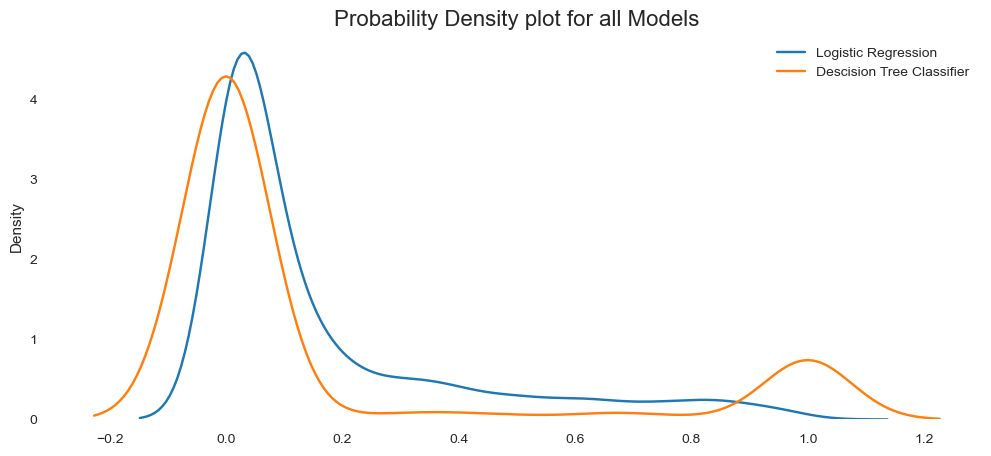

In [27]:
# Plotting kdeplot of Probability desnsity for all models
plt.figure(figsize=(12,5))
sns.kdeplot(y_pred_lr_prob,label="Logistic Regression")
sns.kdeplot(y_pred_dt_prob,label="Descision Tree Classifier")
plt.title("Probability Density plot for all Models",fontsize=16)
plt.legend()
plt.show()

As observed, in general both the algorithms presents most probabilities concentrated around `0`. 
`Descision Tree Classifier` presenting the least with a moderate distributed probabilities around other values and also its predicting best values for `1` class. So, I am selecting `Descision Tree Classifier` as the best model to our context.

Here, We have got the best values of accuracy, precision, recall and f1 score. Descision Tree model 
after hyperparameter Tuning and avoiding overfitting.
Descision Tree Model Accuracies -
- Training -
  - Accuracy - 0.9796204442527496
  - Precision - 0.9397278029812054
  - Recall - 0.9379042690815006
  - F1 Score - 0.9388151505341534
    
- Testing - 
   - Accuracy - 0.9598965071151359
   - Precision - 0.8785529715762274
   - Recall - 0.8808290155440415
   - F1 Score - 0.8796895213454073

# 8) User Input Testing - 

In [28]:
x2.columns

Index(['Air temperature [K]', 'Rotational speed [rpm]', 'Torque [Nm]',
       'Tool wear [min]', 'M', 'L', 'H'],
      dtype='object')

In [29]:
# Writting code to create dictionary of all encoded Features -
encoded = {"columns":list(x2.columns)}
encoded

{'columns': ['Air temperature [K]',
  'Rotational speed [rpm]',
  'Torque [Nm]',
  'Tool wear [min]',
  'M',
  'L',
  'H']}

In [30]:
# Creating json file of encoded so we can further use it.
with open("encoded.json","w") as f:
    json.dump(encoded,f)

In [33]:
# Checking for the 1st entry in the data.
i2_pm_df.iloc[50]

UDI                                   51
Product ID                        L47230
Type                                   L
Air temperature [K]                298.9
Process temperature [K]            309.1
Rotational speed [rpm]            2861.0
Torque [Nm]                          4.6
Tool wear [min]                      143
Target                                 1
Failure Type               Power Failure
Name: 50, dtype: object

In [35]:
# Creating variables and assigning known values for user input testing - 
Type                  = "L"
Air_temperature       = 298.9
Rotational_speed      = 2861.0
Torque                = 4.6
Tool_wear             = 143

In [36]:
# Creating array of values so we can pass the values to the our model -
column_names = x2.columns
array = np.zeros(len(x.columns),dtype=float)
array[0] = Air_temperature
array[1] = Rotational_speed
array[2] = Torque
array[3] = Tool_wear

Type_index = np.where(column_names == Type)[0][0]
array[Type_index] = 1

In [37]:
# printing input array for model after scaling -
array1 = ss.transform([array])
array1

array([[-0.61914426,  5.9774456 , -3.18620951,  0.46358369, -0.32900198,
         0.81292115, -0.65739198]])

In [42]:
# predicting values based on user input from the best model.
Predict_maintainance = np.around(dt_model2.predict(array1)[0])
print("Predicted Maintainance - ",Predict_maintainance)

Predicted Maintainance -  1


In [43]:
# Creating pickle file for Descision Tree model after Sampling and Hyper parameter Tuning -
with open("dt_model.pkl","wb") as f1:
    pickle.dump(dt_model2,f1)

In [44]:
# Creating pickle file for Stander Scalar -
with open("Scaling.pkl","wb") as f2:
    pickle.dump(ss,f2)